In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
# import altair as alt
# Save a vega-lite spec and a PNG blob for each plot in the notebook
# alt.renderers.enable('mimetype')
# # Handle large data sets without embedding them in the notebook
# alt.data_transformers.enable('data_server')

In [2]:
ail_df = pd.read_csv('../../data/processed/ail_price.csv', parse_dates=['date'], index_col='date')
ail_df = ail_df.drop('Unnamed: 0', axis=1)
ail_df = ail_df.sort_values(by='date')
ail_df.head()

,hourly_profile,season,ail,gas_price,price,spark_spread
date,,,,,,
2015-01-01 00:00:00,OFF PEAK,WINTER,9210,2.63,37.45,17.725
2015-01-01 01:00:00,OFF PEAK,WINTER,9045,2.63,34.62,14.895
2015-01-01 02:00:00,OFF PEAK,WINTER,8839,2.63,22.80,3.075
2015-01-01 03:00:00,OFF PEAK,WINTER,8742,2.63,21.05,1.325
2015-01-01 04:00:00,OFF PEAK,WINTER,8699,2.63,20.79,1.065


In [3]:

ail_df.index = pd.to_datetime(ail_df.index)

# use boolean indexing to filter rows in March 2023
df_mar = ail_df[(ail_df.index >= '2023-03-01') & (ail_df.index < '2023-04-01')]
df_mar = ail_df[(ail_df.index >= '2023-03-01') & (ail_df.index < '2023-04-01')]
df_mar

,hourly_profile,season,ail,gas_price,price,spark_spread
date,,,,,,
2023-03-01 00:00:00,OFF PEAK,WINTER,9996,3.07,195.69,172.665
2023-03-01 01:00:00,OFF PEAK,WINTER,9887,3.07,141.75,118.725
2023-03-01 02:00:00,OFF PEAK,WINTER,9894,3.07,74.73,51.705
2023-03-01 03:00:00,OFF PEAK,WINTER,9887,3.07,72.43,49.405
2023-03-01 04:00:00,OFF PEAK,WINTER,9949,3.07,72.43,49.405
...,...,...,...,...,...,...
2023-03-31 18:00:00,ON PEAK,WINTER,10016,2.70,50.86,30.610
2023-03-31 19:00:00,ON PEAK,WINTER,10121,2.70,49.35,29.100
2023-03-31 20:00:00,ON PEAK,WINTER,10075,2.70,51.28,31.030


In [4]:
# alt.Chart(df_mar).mark_point(opacity=0.3, size=10).encode(
#      alt.X(alt.repeat(), type='quantitative'),
#      y='price',
# ).properties(
#     width=200,
#     height=200
# ).repeat(
#     ['ail', 'gas_price', 'spark_spread']
# )

In [5]:
# alt.Chart(ail_df).mark_point(opacity=0.3, size=10).encode(
#      alt.X(alt.repeat(), type='quantitative'),
#      y='price',
# ).properties(
#     width=200,
#     height=200
# ).repeat(
#     ['ail', 'gas_price', 'spark_spread']
# )

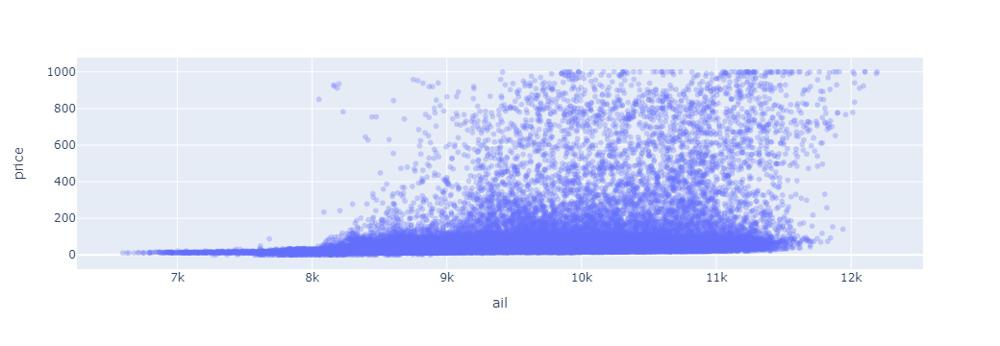

In [6]:
import plotly.express as px

# assuming your DataFrame is named ail_df
fig = px.scatter(ail_df, x='ail', y='price', opacity=0.3)
fig.show()


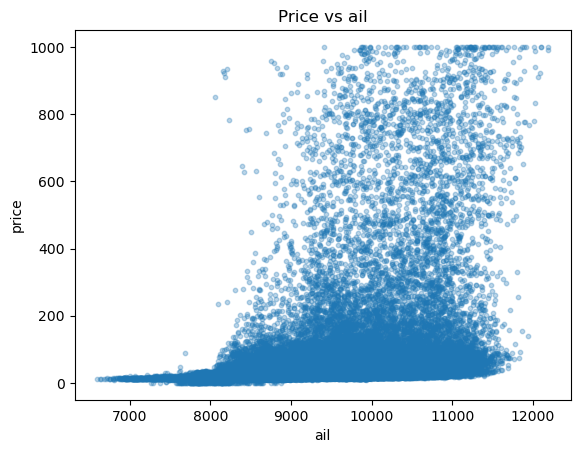

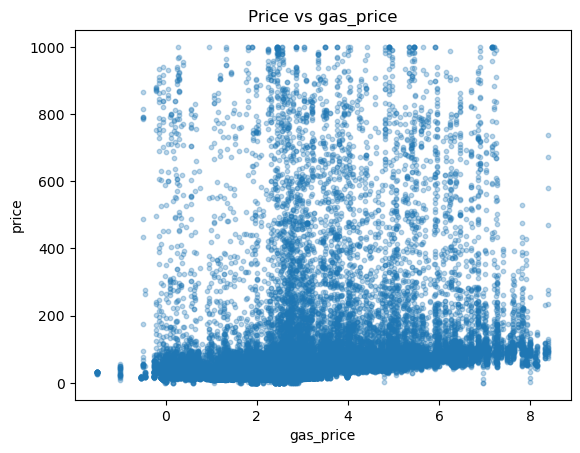

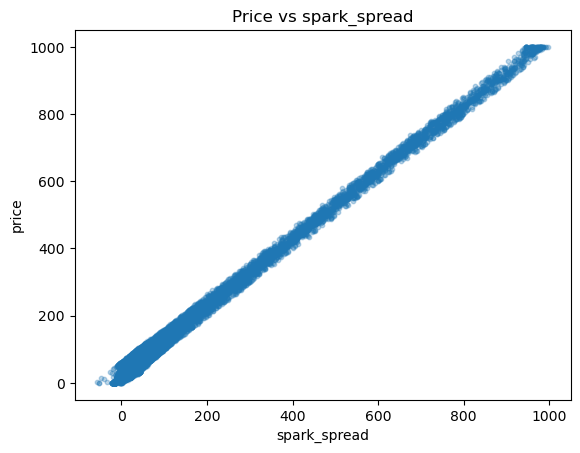

In [7]:
import matplotlib.pyplot as plt

columns = ['ail', 'gas_price', 'spark_spread']
for col in columns:
    plt.scatter(ail_df[col], ail_df['price'], alpha=0.3, s=10)
    plt.xlabel(col)
    plt.ylabel('price')
    plt.title(f'Price vs {col}')
    plt.show()


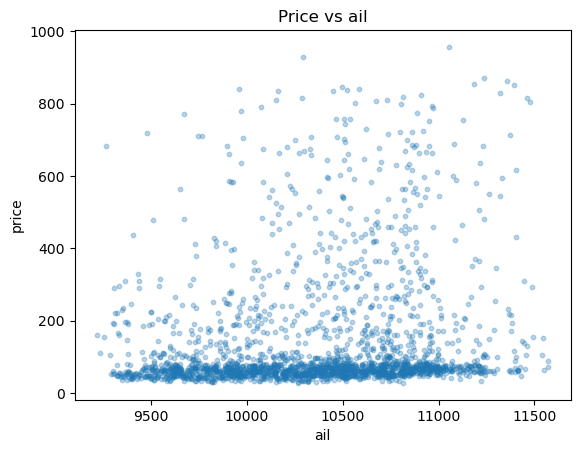

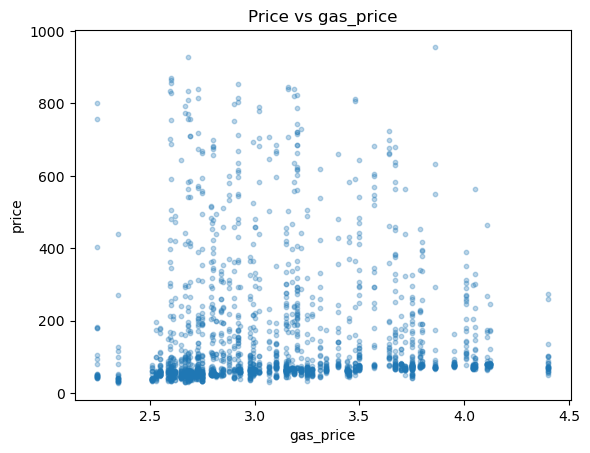

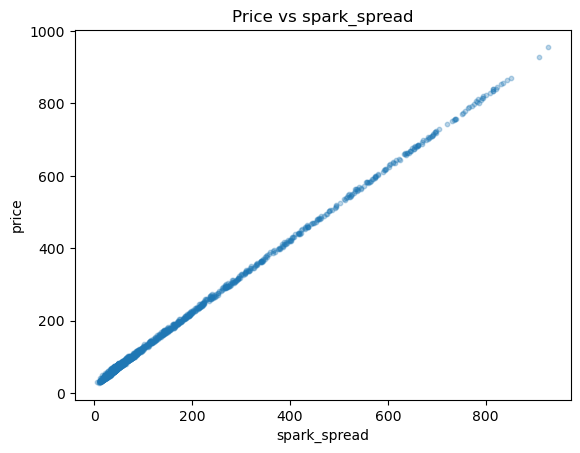

In [8]:
df_2023 = ail_df[ail_df.index.year == 2023]

columns = ['ail', 'gas_price', 'spark_spread']
for col in columns:
    plt.scatter(df_2023[col], df_2023['price'], alpha=0.3, s=10)
    plt.xlabel(col)
    plt.ylabel('price')
    plt.title(f'Price vs {col}')
    plt.show()


In [9]:
df_2023.corr().style.background_gradient()

,ail,gas_price,price,spark_spread
ail,1.000000,0.093569,0.165312,0.163377
gas_price,0.093569,1.000000,0.038334,0.016620
price,0.165312,0.038334,1.000000,0.999764
spark_spread,0.163377,0.016620,0.999764,1.000000


In [10]:
df_mar.corr().style.background_gradient()

,ail,gas_price,price,spark_spread
ail,1.000000,0.420714,0.073074,0.068827
gas_price,0.420714,1.000000,0.106226,0.096062
price,0.073074,0.106226,1.000000,0.999948
spark_spread,0.068827,0.096062,0.999948,1.000000


In [11]:
ail_df.corr().style.background_gradient()

,ail,gas_price,price,spark_spread
ail,1.000000,0.208441,0.282861,0.270231
gas_price,0.208441,1.000000,0.289959,0.205188
price,0.282861,0.289959,1.000000,0.996172
spark_spread,0.270231,0.205188,0.996172,1.000000


In [12]:
ail_df.corr('spearman').style.background_gradient()

,ail,gas_price,price,spark_spread
ail,1.000000,0.213963,0.502481,0.437394
gas_price,0.213963,1.000000,0.433606,0.126080
price,0.502481,0.433606,1.000000,0.913406
spark_spread,0.437394,0.126080,0.913406,1.000000


In [13]:
df_mar.corr().style.background_gradient()

,ail,gas_price,price,spark_spread
ail,1.000000,0.420714,0.073074,0.068827
gas_price,0.420714,1.000000,0.106226,0.096062
price,0.073074,0.106226,1.000000,0.999948
spark_spread,0.068827,0.096062,0.999948,1.000000


In [14]:
df_mar.corr('spearman').style.background_gradient()

,ail,gas_price,price,spark_spread
ail,1.000000,0.427454,0.039589,0.011525
gas_price,0.427454,1.000000,0.289303,0.231923
price,0.039589,0.289303,1.000000,0.996206
spark_spread,0.011525,0.231923,0.996206,1.000000


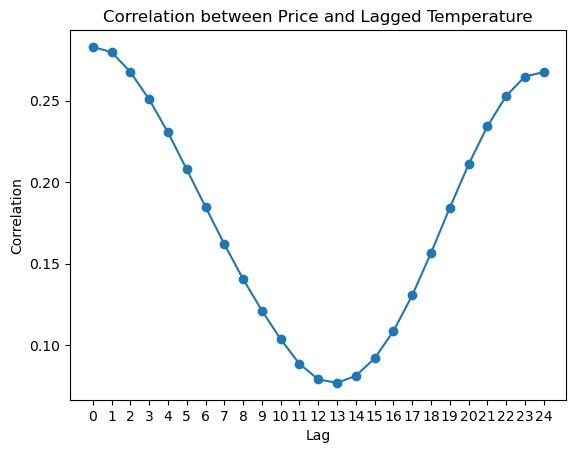

In [15]:
import pandas as pd
import matplotlib.pyplot as plt

val = 25
# Create lagged temperature columns
for i in range(0, val):
    ail_df[f'temp_lag_{i}'] = ail_df['ail'].shift(i)

# Calculate correlation with different lags
correlations = []
for i in range(0, val):
    corr = ail_df['price'].corr(ail_df[f'temp_lag_{i}'])
    correlations.append(corr)

# Plot correlations
plt.plot(range(0, val), correlations, marker='o')
plt.title('Correlation between Price and Lagged Temperature')
plt.xlabel('Lag')
plt.ylabel('Correlation')
plt.xticks(range(0, val))
plt.show()


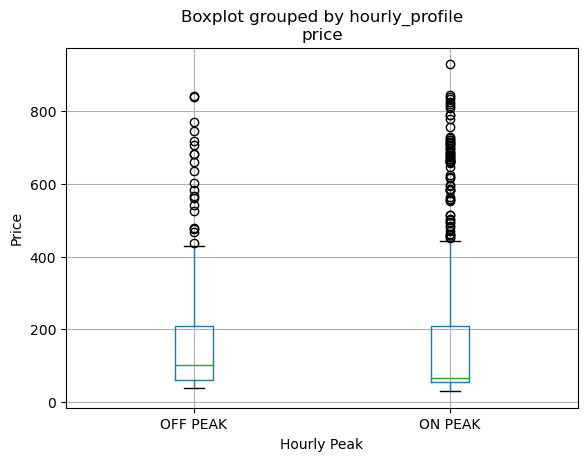

In [16]:
import matplotlib.pyplot as plt

df_mar.boxplot(column='price', by='hourly_profile')
plt.xlabel('Hourly Peak')
plt.ylabel('Price')
plt.show()

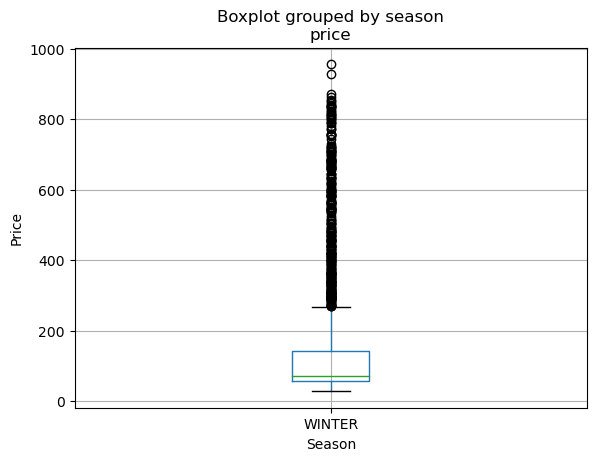

In [17]:
import matplotlib.pyplot as plt

df_2023.boxplot(column='price', by='season')
plt.xlabel('Season')
plt.ylabel('Price')
plt.show()

In [18]:
df_2023.shape

(2159, 6)

In [19]:
df_2023['season'].unique()

array(['WINTER'], dtype=object)

In [20]:
region_df = pd.read_csv('../../data/raw/regional_load.csv',parse_dates=['Date (MST)'], index_col='Date (MST)')
merged_df = pd.merge(ail_df, region_df, right_on='Date (MST)', left_index=True)
merged_df.shape

(72287, 44)

In [21]:
reg_df_mar = merged_df[(merged_df.index >= '2023-03-01') & (merged_df.index < '2023-04-01')]
reg_df_2023 = merged_df[merged_df.index.year == 2023]

In [22]:
reg_df_mar.corr('spearman').style.background_gradient()

,ail,gas_price,price,spark_spread,temp_lag_0,temp_lag_1,temp_lag_2,temp_lag_3,temp_lag_4,temp_lag_5,temp_lag_6,temp_lag_7,temp_lag_8,temp_lag_9,temp_lag_10,temp_lag_11,temp_lag_12,temp_lag_13,temp_lag_14,temp_lag_15,temp_lag_16,temp_lag_17,temp_lag_18,temp_lag_19,temp_lag_20,temp_lag_21,temp_lag_22,temp_lag_23,temp_lag_24,Calgary,Central,Edmonton,Losses,Northeast,Northwest,South,System Load
ail,1.000000,0.427454,0.039589,0.011525,1.000000,0.951139,0.838484,0.695693,0.537644,0.379827,0.238658,0.127313,0.053465,0.016531,0.005009,0.002434,0.001777,0.006178,0.011097,0.021245,0.054217,0.121508,0.221949,0.347926,0.488036,0.627527,0.751614,0.845924,0.881645,0.936690,0.842372,0.943198,0.296562,0.202626,0.233223,0.246415,0.974965
gas_price,0.427454,1.000000,0.289303,0.231923,0.427454,0.426316,0.425178,0.424399,0.422619,0.421721,0.420060,0.418109,0.417017,0.416991,0.416948,0.416605,0.415566,0.415071,0.415815,0.416477,0.416173,0.415555,0.415333,0.415281,0.415740,0.415559,0.415012,0.414433,0.414409,0.231668,0.525075,0.228104,0.284435,0.325081,0.134025,0.350255,0.369329
price,0.039589,0.289303,1.000000,0.996206,0.039589,0.000220,-0.042556,-0.057102,-0.039655,0.003631,0.070811,0.156172,0.243989,0.323751,0.378567,0.387389,0.344758,0.266656,0.181583,0.108954,0.051534,0.016758,-0.002594,-0.002607,0.017944,0.047653,0.069532,0.068286,0.036603,0.025455,0.234699,0.044097,-0.260390,0.023778,-0.613015,0.439397,0.039770
spark_spread,0.011525,0.231923,0.996206,1.000000,0.011525,-0.027472,-0.069827,-0.084048,-0.065802,-0.020832,0.047979,0.134656,0.223791,0.304248,0.359379,0.367870,0.323841,0.244260,0.158204,0.084656,0.026267,-0.009089,-0.029137,-0.029433,-0.008103,0.021969,0.043512,0.041675,0.009754,0.007982,0.205043,0.027202,-0.284546,0.006772,-0.632635,0.427076,0.014788
temp_lag_0,1.000000,0.427454,0.039589,0.011525,1.000000,0.951139,0.838484,0.695693,0.537644,0.379827,0.238658,0.127313,0.053465,0.016531,0.005009,0.002434,0.001777,0.006178,0.011097,0.021245,0.054217,0.121508,0.221949,0.347926,0.488036,0.627527,0.751614,0.845924,0.881645,0.936690,0.842372,0.943198,0.296562,0.202626,0.233223,0.246415,0.974965
temp_lag_1,0.951139,0.426316,0.000220,-0.027472,0.951139,1.000000,0.950706,0.837890,0.694448,0.536132,0.378362,0.237555,0.126475,0.052594,0.015812,0.004618,0.002462,0.002287,0.007213,0.012172,0.022056,0.054595,0.120618,0.219957,0.346121,0.486443,0.626230,0.750616,0.845214,0.890571,0.783655,0.906790,0.252037,0.200614,0.254804,0.198562,0.920059
temp_lag_2,0.838484,0.425178,-0.042556,-0.069827,0.838484,0.950706,1.000000,0.950802,0.837842,0.694420,0.536353,0.379034,0.238644,0.127558,0.053964,0.017479,0.006584,0.004845,0.005091,0.010047,0.014806,0.024348,0.054967,0.118922,0.218016,0.344063,0.484569,0.624586,0.749212,0.776559,0.678120,0.798398,0.204399,0.197937,0.280460,0.143634,0.800780
temp_lag_3,0.695693,0.424399,-0.057102,-0.084048,0.695693,0.837890,0.950802,1.000000,0.950849,0.838275,0.695336,0.537774,0.381034,0.240877,0.130169,0.056864,0.020547,0.009848,0.008284,0.008574,0.013452,0.018152,0.025787,0.054010,0.117541,0.216339,0.342412,0.482975,0.623105,0.626684,0.558259,0.650895,0.155096,0.200544,0.302272,0.112412,0.654950
temp_lag_4,0.537644,0.422619,-0.039655,-0.065802,0.537644,0.694448,0.837842,0.950849,1.000000,0.951117,0.839040,0.696624,0.539757,0.383386,0.243882,0.133671,0.060691,0.024649,0.014132,0.012586,0.012785,0.017562,0.019904,0.024510,0.052037,0.115113,0.213926,0.340013,0.480703,0.456391,0.440126,0.481904,0.114931,0.209521,0.299363,0.115865,0.499616
temp_lag_5,0.379827,0.421721,0.003631,-0.020832,0.379827,0.536132,0.694420,0.838275,0.951117,1.000000,0.951322,0.839718,0.697981,0.541473,0.385875,0.247040,0.137340,0.064829,0.029176,0.018694,0.016992,0.016945,0.019147,0.018192,0.022039,0.049115,0.112255,0.211174,0.337434,0.284617,0.337687,0.311058,0.089014,0.227044,0.274446,0.157107,0.350563


In [23]:
#merged_df
#reg_df_mar
#df_2023
linear_corr_df = reg_df_mar.corr().loc[['price']]
linear_corr_df = linear_corr_df[(linear_corr_df > 0.2)].dropna(axis=1)
linear_corr_df

,price,spark_spread,temp_lag_9,temp_lag_10,temp_lag_11,temp_lag_12,Central,South
price,1.0,0.999948,0.204601,0.253856,0.261506,0.22224,0.22934,0.420738


In [24]:
nonlinear_corr_df = reg_df_mar.corr('spearman').loc[['price']]
nonlinear_corr_df = nonlinear_corr_df[(nonlinear_corr_df > 0.3)].dropna(axis=1)
nonlinear_corr_df

,price,spark_spread,temp_lag_9,temp_lag_10,temp_lag_11,temp_lag_12,South
price,1.0,0.996206,0.323751,0.378567,0.387389,0.344758,0.439397


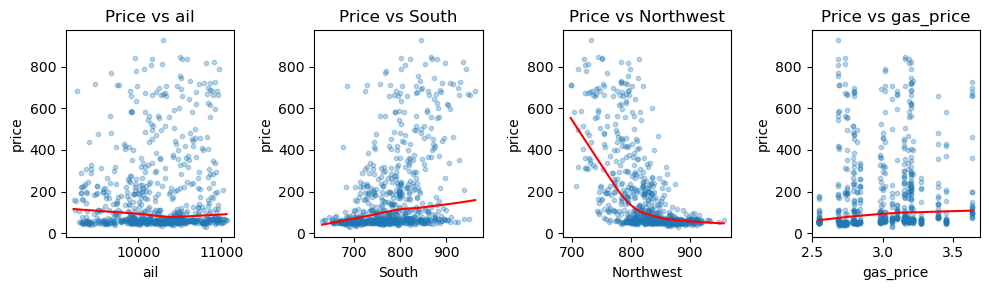

In [25]:
import matplotlib.pyplot as plt
import statsmodels.api as sm

columns = ['ail', 'South', 'Northwest', 'gas_price']

fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(10, 3))
axs = axs.flatten()

for i, col in enumerate(columns):
    plt.sca(axs[i])
    plt.scatter(reg_df_mar[col], reg_df_mar['price'], alpha=0.3, s=10)
    plt.xlabel(col)
    plt.ylabel('price')
    plt.title(f'Price vs {col}')
    lowess = sm.nonparametric.lowess(reg_df_mar['price'], reg_df_mar[col])
    plt.plot(lowess[:, 0], lowess[:, 1], color='red')

plt.tight_layout()
plt.show()


In [26]:
reg_df_mar.corr('spearman').style.background_gradient(cmap='coolwarm')

,ail,gas_price,price,spark_spread,temp_lag_0,temp_lag_1,temp_lag_2,temp_lag_3,temp_lag_4,temp_lag_5,temp_lag_6,temp_lag_7,temp_lag_8,temp_lag_9,temp_lag_10,temp_lag_11,temp_lag_12,temp_lag_13,temp_lag_14,temp_lag_15,temp_lag_16,temp_lag_17,temp_lag_18,temp_lag_19,temp_lag_20,temp_lag_21,temp_lag_22,temp_lag_23,temp_lag_24,Calgary,Central,Edmonton,Losses,Northeast,Northwest,South,System Load
ail,1.000000,0.427454,0.039589,0.011525,1.000000,0.951139,0.838484,0.695693,0.537644,0.379827,0.238658,0.127313,0.053465,0.016531,0.005009,0.002434,0.001777,0.006178,0.011097,0.021245,0.054217,0.121508,0.221949,0.347926,0.488036,0.627527,0.751614,0.845924,0.881645,0.936690,0.842372,0.943198,0.296562,0.202626,0.233223,0.246415,0.974965
gas_price,0.427454,1.000000,0.289303,0.231923,0.427454,0.426316,0.425178,0.424399,0.422619,0.421721,0.420060,0.418109,0.417017,0.416991,0.416948,0.416605,0.415566,0.415071,0.415815,0.416477,0.416173,0.415555,0.415333,0.415281,0.415740,0.415559,0.415012,0.414433,0.414409,0.231668,0.525075,0.228104,0.284435,0.325081,0.134025,0.350255,0.369329
price,0.039589,0.289303,1.000000,0.996206,0.039589,0.000220,-0.042556,-0.057102,-0.039655,0.003631,0.070811,0.156172,0.243989,0.323751,0.378567,0.387389,0.344758,0.266656,0.181583,0.108954,0.051534,0.016758,-0.002594,-0.002607,0.017944,0.047653,0.069532,0.068286,0.036603,0.025455,0.234699,0.044097,-0.260390,0.023778,-0.613015,0.439397,0.039770
spark_spread,0.011525,0.231923,0.996206,1.000000,0.011525,-0.027472,-0.069827,-0.084048,-0.065802,-0.020832,0.047979,0.134656,0.223791,0.304248,0.359379,0.367870,0.323841,0.244260,0.158204,0.084656,0.026267,-0.009089,-0.029137,-0.029433,-0.008103,0.021969,0.043512,0.041675,0.009754,0.007982,0.205043,0.027202,-0.284546,0.006772,-0.632635,0.427076,0.014788
temp_lag_0,1.000000,0.427454,0.039589,0.011525,1.000000,0.951139,0.838484,0.695693,0.537644,0.379827,0.238658,0.127313,0.053465,0.016531,0.005009,0.002434,0.001777,0.006178,0.011097,0.021245,0.054217,0.121508,0.221949,0.347926,0.488036,0.627527,0.751614,0.845924,0.881645,0.936690,0.842372,0.943198,0.296562,0.202626,0.233223,0.246415,0.974965
temp_lag_1,0.951139,0.426316,0.000220,-0.027472,0.951139,1.000000,0.950706,0.837890,0.694448,0.536132,0.378362,0.237555,0.126475,0.052594,0.015812,0.004618,0.002462,0.002287,0.007213,0.012172,0.022056,0.054595,0.120618,0.219957,0.346121,0.486443,0.626230,0.750616,0.845214,0.890571,0.783655,0.906790,0.252037,0.200614,0.254804,0.198562,0.920059
temp_lag_2,0.838484,0.425178,-0.042556,-0.069827,0.838484,0.950706,1.000000,0.950802,0.837842,0.694420,0.536353,0.379034,0.238644,0.127558,0.053964,0.017479,0.006584,0.004845,0.005091,0.010047,0.014806,0.024348,0.054967,0.118922,0.218016,0.344063,0.484569,0.624586,0.749212,0.776559,0.678120,0.798398,0.204399,0.197937,0.280460,0.143634,0.800780
temp_lag_3,0.695693,0.424399,-0.057102,-0.084048,0.695693,0.837890,0.950802,1.000000,0.950849,0.838275,0.695336,0.537774,0.381034,0.240877,0.130169,0.056864,0.020547,0.009848,0.008284,0.008574,0.013452,0.018152,0.025787,0.054010,0.117541,0.216339,0.342412,0.482975,0.623105,0.626684,0.558259,0.650895,0.155096,0.200544,0.302272,0.112412,0.654950
temp_lag_4,0.537644,0.422619,-0.039655,-0.065802,0.537644,0.694448,0.837842,0.950849,1.000000,0.951117,0.839040,0.696624,0.539757,0.383386,0.243882,0.133671,0.060691,0.024649,0.014132,0.012586,0.012785,0.017562,0.019904,0.024510,0.052037,0.115113,0.213926,0.340013,0.480703,0.456391,0.440126,0.481904,0.114931,0.209521,0.299363,0.115865,0.499616
temp_lag_5,0.379827,0.421721,0.003631,-0.020832,0.379827,0.536132,0.694420,0.838275,0.951117,1.000000,0.951322,0.839718,0.697981,0.541473,0.385875,0.247040,0.137340,0.064829,0.029176,0.018694,0.016992,0.016945,0.019147,0.018192,0.022039,0.049115,0.112255,0.211174,0.337434,0.284617,0.337687,0.311058,0.089014,0.227044,0.274446,0.157107,0.350563


mar linear 

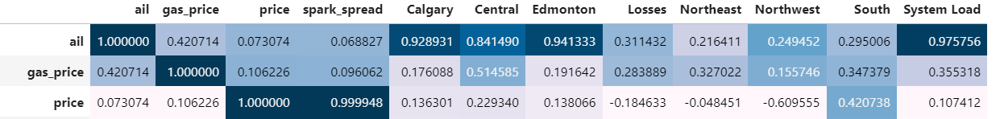

mar non linear 

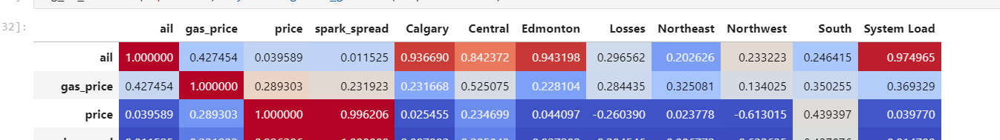

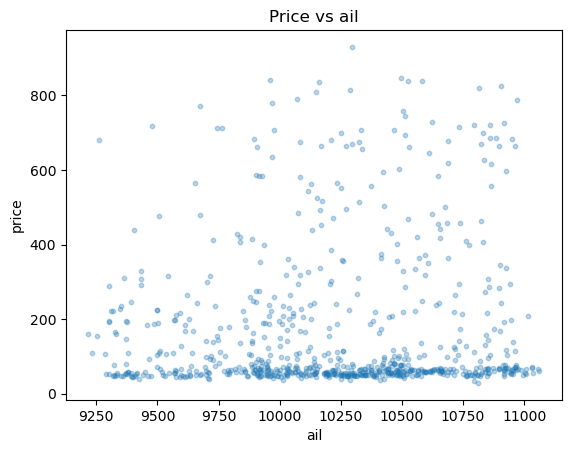

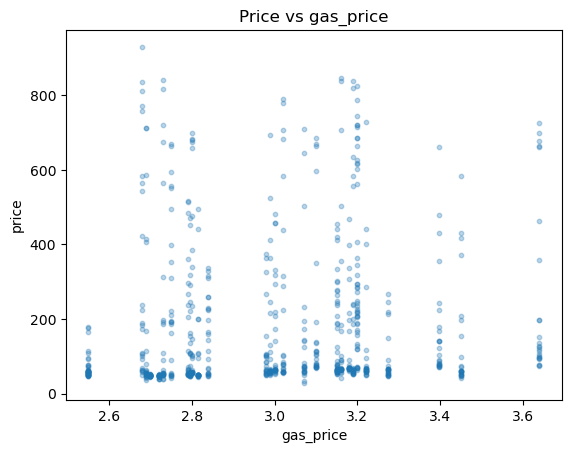

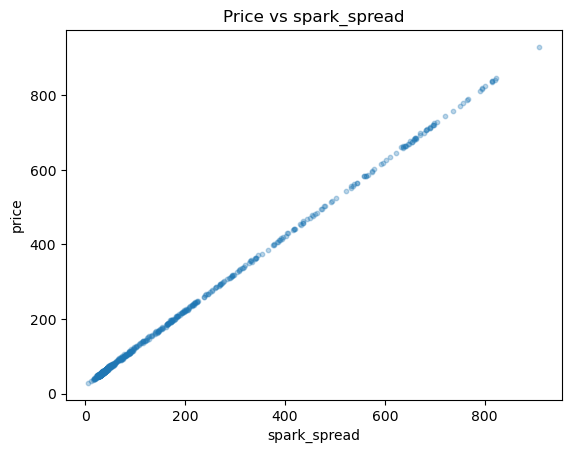

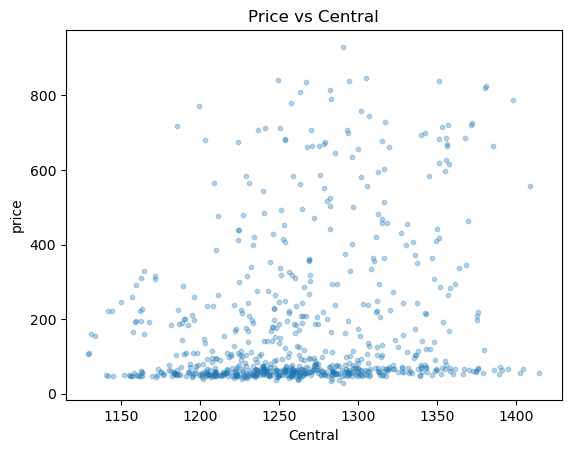

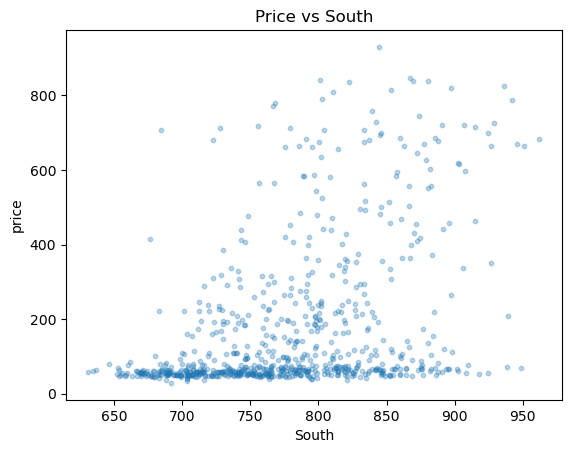

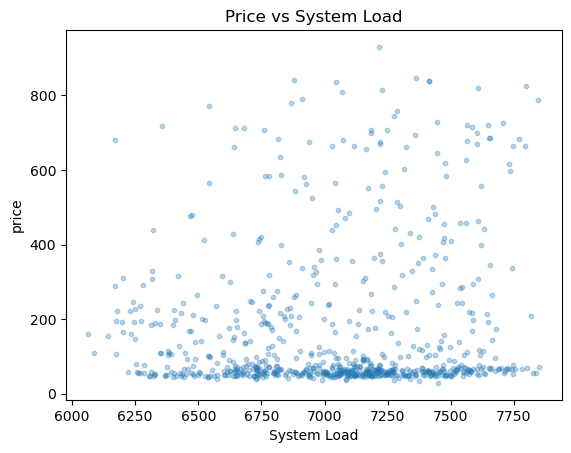

In [27]:
columns = ['ail', 'gas_price', 'spark_spread', 'Central', 'South' ,'System Load']
for col in columns:
    plt.scatter(reg_df_mar[col], reg_df_mar['price'], alpha=0.3, s=10)
    plt.xlabel(col)
    plt.ylabel('price')
    plt.title(f'Price vs {col}')
    plt.show()

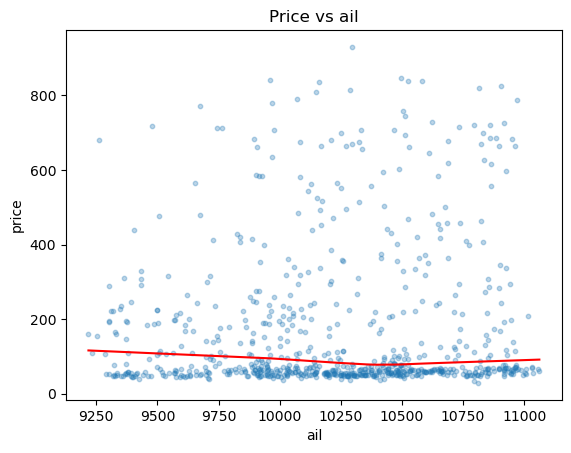

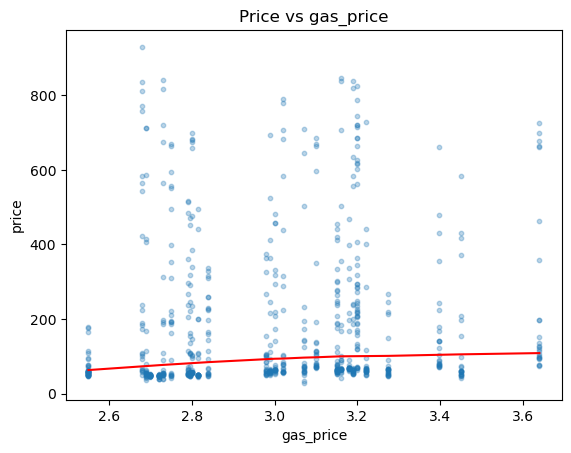

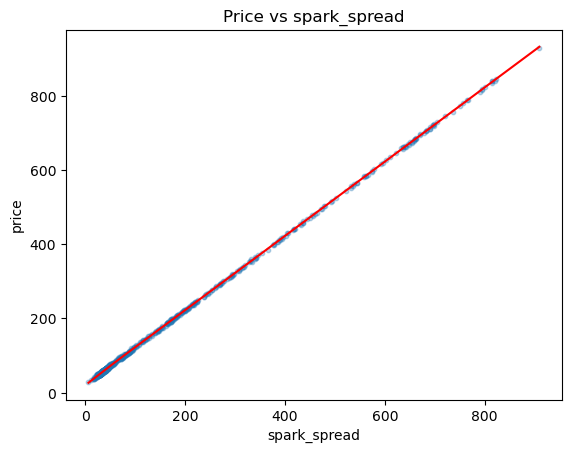

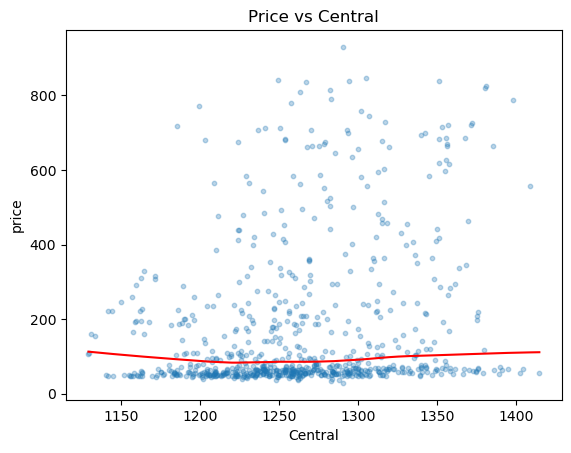

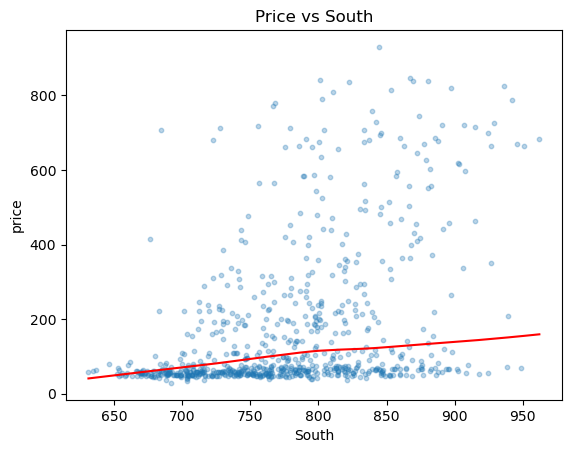

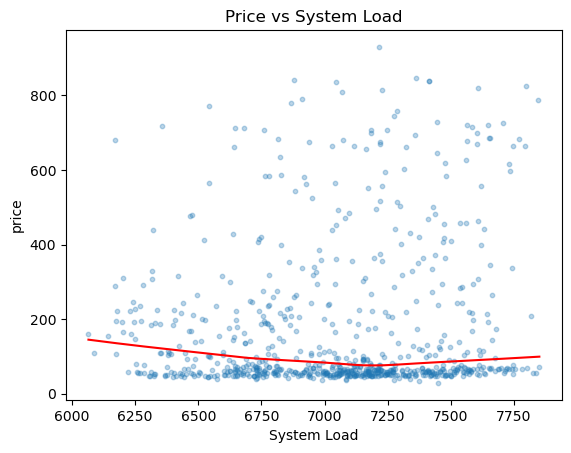

In [28]:
import statsmodels.api as sm
import matplotlib.pyplot as plt

columns = ['ail', 'gas_price', 'spark_spread', 'Central', 'South' ,'System Load']
for col in columns:
    plt.scatter(reg_df_mar[col], reg_df_mar['price'], alpha=0.3, s=10)
    plt.xlabel(col)
    plt.ylabel('price')
    plt.title(f'Price vs {col}')
    lowess = sm.nonparametric.lowess(reg_df_mar['price'], reg_df_mar[col])
    plt.plot(lowess[:, 0], lowess[:, 1], color='red')
    plt.show()


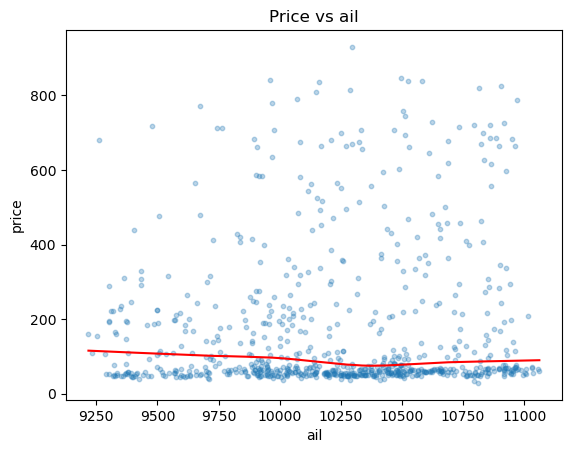

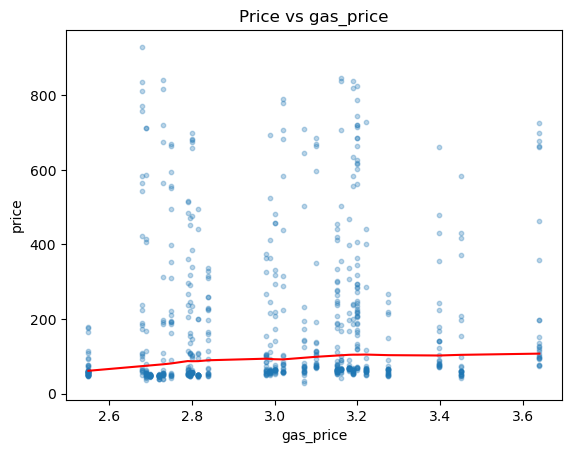

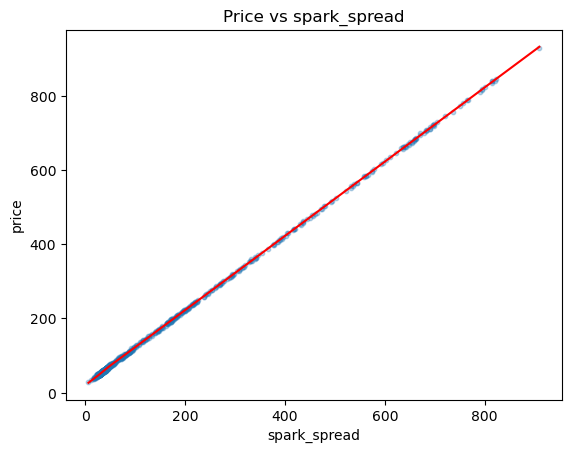

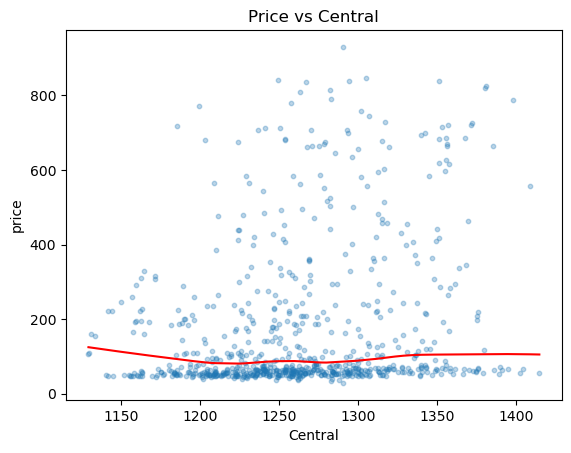

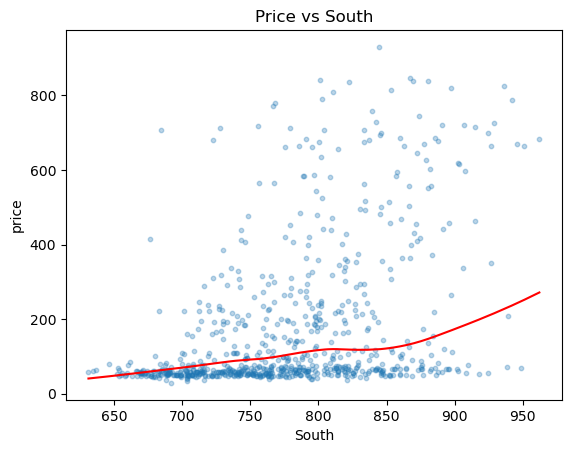

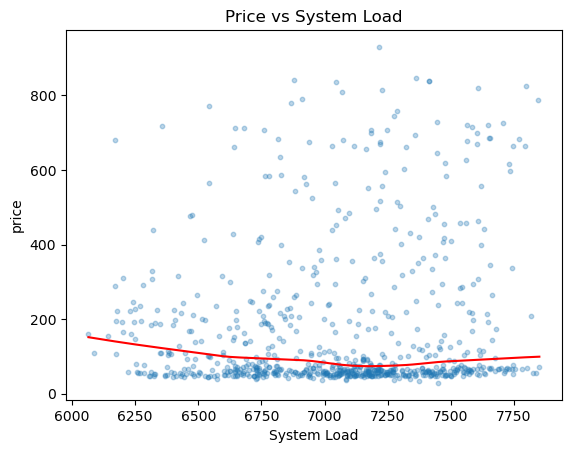

In [29]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import statsmodels.api as sm
# define the columns to plot
columns = ['ail', 'gas_price', 'spark_spread', 'Central', 'South', 'System Load']

# Locally weightd regression curve
# loop over the columns and plot the data and LOESS curve
for col in columns:
    fig, ax = plt.subplots()
    ax.scatter(reg_df_mar[col], reg_df_mar['price'], alpha=0.3, s=10)
    ax.set_xlabel(col)
    ax.set_ylabel('price')
    ax.set_title(f'Price vs {col}')
    
    # fit a LOESS curve
    lowess = sm.nonparametric.lowess(reg_df_mar['price'], reg_df_mar[col], frac=0.5)
    ax.plot(lowess[:, 0], lowess[:, 1], color='red')
    
    plt.show()

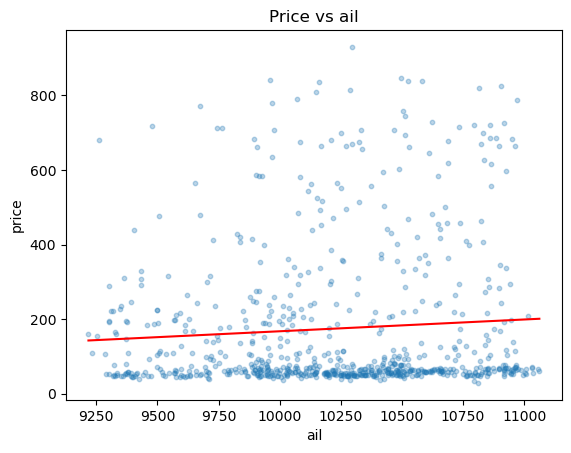

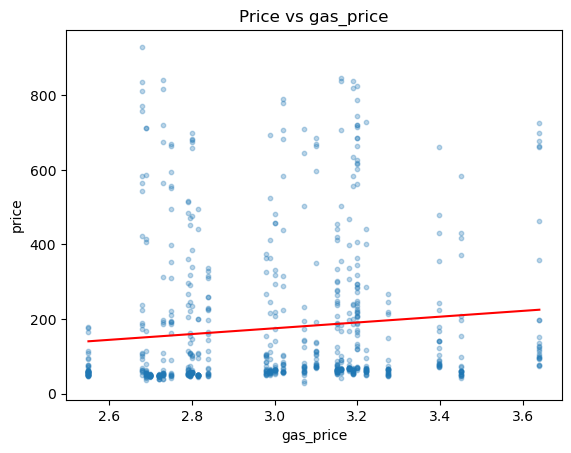

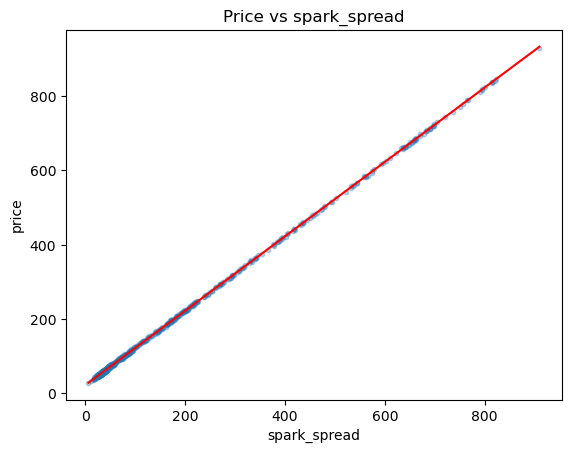

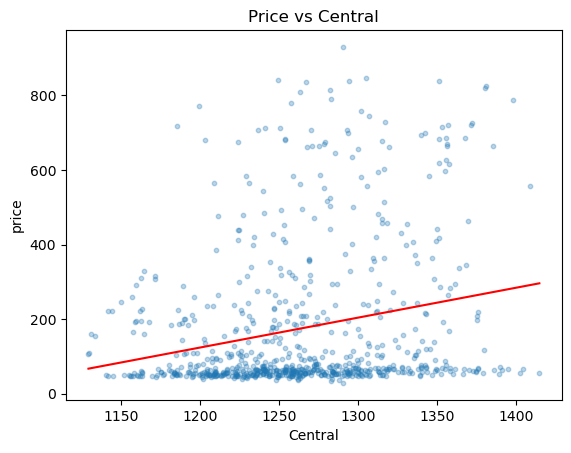

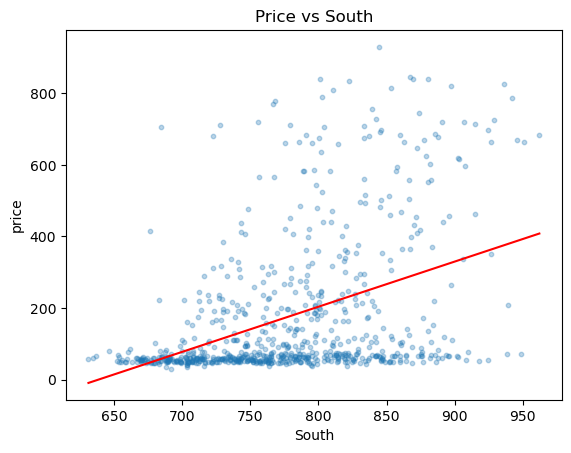

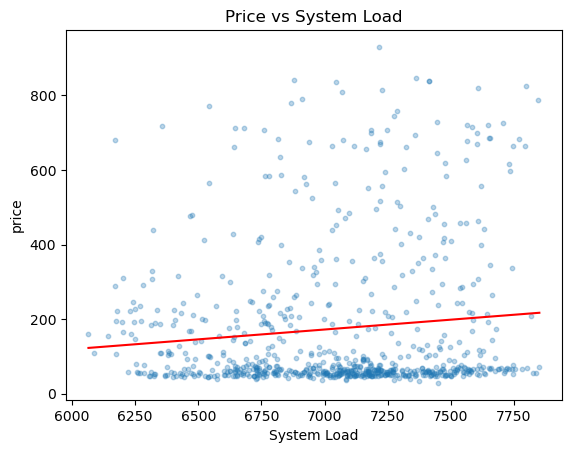

In [30]:

import numpy as np
# define the columns to plot
columns = ['ail', 'gas_price', 'spark_spread', 'Central', 'South', 'System Load']

# loop over the columns and plot the data and regression line
for col in columns:
    fig, ax = plt.subplots()
    ax.scatter(reg_df_mar[col], reg_df_mar['price'], alpha=0.3, s=10)
    ax.set_xlabel(col)
    ax.set_ylabel('price')
    ax.set_title(f'Price vs {col}')
    
    # fit a linear regression model
    slope, intercept = np.polyfit(reg_df_mar[col], reg_df_mar['price'], deg=1)
    
    # plot the regression line
    x = np.linspace(reg_df_mar[col].min(), reg_df_mar[col].max(), 100)
    y_pred = slope * x + intercept
    ax.plot(x, y_pred, color='red')
    
    plt.show()

In [31]:
# Entire year correlation with regions 

reg_df_2023.corr().style.background_gradient()

,ail,gas_price,price,spark_spread,temp_lag_0,temp_lag_1,temp_lag_2,temp_lag_3,temp_lag_4,temp_lag_5,temp_lag_6,temp_lag_7,temp_lag_8,temp_lag_9,temp_lag_10,temp_lag_11,temp_lag_12,temp_lag_13,temp_lag_14,temp_lag_15,temp_lag_16,temp_lag_17,temp_lag_18,temp_lag_19,temp_lag_20,temp_lag_21,temp_lag_22,temp_lag_23,temp_lag_24,Calgary,Central,Edmonton,Losses,Northeast,Northwest,South,System Load
ail,1.000000,0.093569,0.165312,0.163377,1.000000,0.956303,0.847287,0.699978,0.534104,0.367883,0.218130,0.097284,0.012247,-0.038818,-0.066543,-0.082516,-0.089974,-0.087703,-0.077560,-0.056846,-0.013980,0.061536,0.171217,0.308620,0.461488,0.613568,0.747008,0.842780,0.876966,0.939450,0.844429,0.960373,0.110488,0.336976,0.241754,0.513906,0.976260
gas_price,0.093569,1.000000,0.038334,0.016620,0.093569,0.093239,0.092660,0.091891,0.091075,0.090646,0.090229,0.089723,0.089238,0.088658,0.088015,0.087859,0.087175,0.086187,0.085067,0.084141,0.082851,0.081483,0.080466,0.079441,0.078448,0.077488,0.076479,0.075377,0.074294,0.058157,0.222412,0.109264,0.260594,-0.256362,-0.118472,0.117567,0.108034
price,0.165312,0.038334,1.000000,0.999764,0.165312,0.128001,0.080277,0.049689,0.034744,0.034175,0.047194,0.069859,0.097153,0.120591,0.127036,0.104550,0.057870,0.005313,-0.043371,-0.081661,-0.099661,-0.088614,-0.059147,-0.011276,0.048499,0.107292,0.150409,0.167020,0.147200,0.236574,0.127166,0.220575,-0.143880,0.041163,-0.535488,0.221402,0.153848
spark_spread,0.163377,0.016620,0.999764,1.000000,0.163377,0.126051,0.078310,0.047721,0.032785,0.032225,0.045261,0.067950,0.095272,0.118735,0.125198,0.102703,0.056010,0.003443,-0.045246,-0.083539,-0.101521,-0.090439,-0.060931,-0.013009,0.046822,0.105672,0.148836,0.165481,0.145673,0.235451,0.122408,0.218331,-0.149631,0.046760,-0.533232,0.218979,0.151592
temp_lag_0,1.000000,0.093569,0.165312,0.163377,1.000000,0.956303,0.847287,0.699978,0.534104,0.367883,0.218130,0.097284,0.012247,-0.038818,-0.066543,-0.082516,-0.089974,-0.087703,-0.077560,-0.056846,-0.013980,0.061536,0.171217,0.308620,0.461488,0.613568,0.747008,0.842780,0.876966,0.939450,0.844429,0.960373,0.110488,0.336976,0.241754,0.513906,0.976260
temp_lag_1,0.956303,0.093239,0.128001,0.126051,0.956303,1.000000,0.956300,0.847279,0.699881,0.533719,0.367333,0.217505,0.096831,0.011827,-0.039129,-0.066792,-0.082641,-0.089973,-0.087522,-0.077325,-0.056638,-0.013875,0.061357,0.170693,0.308055,0.461003,0.613232,0.746801,0.842639,0.890506,0.808058,0.922717,0.065227,0.334444,0.252881,0.474285,0.928258
temp_lag_2,0.847287,0.092660,0.080277,0.078310,0.847287,0.956300,1.000000,0.956297,0.847230,0.699668,0.533399,0.366948,0.217242,0.096582,0.011644,-0.039268,-0.066848,-0.082614,-0.089837,-0.087363,-0.077194,-0.056597,-0.014052,0.060908,0.170199,0.307623,0.460702,0.613063,0.746721,0.772271,0.721298,0.814562,0.024783,0.316516,0.263125,0.402065,0.815176
temp_lag_3,0.699978,0.091891,0.049689,0.047721,0.699978,0.847279,0.956297,1.000000,0.956285,0.847161,0.699542,0.533218,0.366843,0.217135,0.096507,0.011601,-0.039260,-0.066795,-0.082515,-0.089744,-0.087301,-0.077209,-0.056770,-0.014421,0.060496,0.169836,0.307370,0.460576,0.613041,0.613307,0.608515,0.662910,-0.004889,0.291989,0.265706,0.335233,0.667796
temp_lag_4,0.534104,0.091075,0.034744,0.032785,0.534104,0.699881,0.847230,0.956285,1.000000,0.956273,0.847113,0.699440,0.533176,0.366790,0.217103,0.096506,0.011645,-0.039181,-0.066690,-0.082435,-0.089705,-0.087353,-0.077424,-0.057183,-0.014898,0.060040,0.169469,0.307128,0.460464,0.434582,0.486988,0.488832,-0.028092,0.265404,0.253477,0.292322,0.506224
temp_lag_5,0.367883,0.090646,0.034175,0.032225,0.367883,0.533719,0.699668,0.847161,0.956273,1.000000,0.956261,0.847076,0.699445,0.533133,0.366776,0.217140,0.096608,0.011796,-0.039006,-0.066572,-0.082391,-0.089823,-0.087736,-0.078114,-0.057993,-0.015724,0.059288,0.168853,0.306699,0.253375,0.372330,0.310732,-0.045412,0.243880,0.234142,0.278452,0.348150


In [32]:
reg_df_2023.corr('spearman').style.background_gradient(cmap='coolwarm')

,ail,gas_price,price,spark_spread,temp_lag_0,temp_lag_1,temp_lag_2,temp_lag_3,temp_lag_4,temp_lag_5,temp_lag_6,temp_lag_7,temp_lag_8,temp_lag_9,temp_lag_10,temp_lag_11,temp_lag_12,temp_lag_13,temp_lag_14,temp_lag_15,temp_lag_16,temp_lag_17,temp_lag_18,temp_lag_19,temp_lag_20,temp_lag_21,temp_lag_22,temp_lag_23,temp_lag_24,Calgary,Central,Edmonton,Losses,Northeast,Northwest,South,System Load
ail,1.000000,0.122663,0.208092,0.217534,1.000000,0.953348,0.839702,0.689372,0.522583,0.356821,0.207520,0.084890,-0.004837,-0.061844,-0.094780,-0.113817,-0.121812,-0.117271,-0.103104,-0.077225,-0.029349,0.049651,0.160116,0.296117,0.447149,0.598198,0.732384,0.830531,0.866275,0.943528,0.846668,0.961588,0.098254,0.308670,0.227732,0.519439,0.975835
gas_price,0.122663,1.000000,0.358500,0.271449,0.122663,0.122700,0.122578,0.122358,0.122168,0.122362,0.122399,0.122280,0.122117,0.121947,0.121765,0.121904,0.121499,0.120768,0.119875,0.119095,0.117981,0.116687,0.115667,0.114649,0.113786,0.112962,0.112016,0.111033,0.110014,0.109660,0.205230,0.141344,0.249225,-0.252659,-0.153688,0.111154,0.119426
price,0.208092,0.358500,1.000000,0.990819,0.208092,0.178617,0.136606,0.107486,0.092920,0.084465,0.085318,0.095292,0.113671,0.133101,0.143008,0.128782,0.092717,0.047788,0.004241,-0.031854,-0.052120,-0.046793,-0.023905,0.016413,0.068268,0.119982,0.158198,0.173277,0.159467,0.248667,0.208767,0.255569,-0.155881,-0.002500,-0.569878,0.234819,0.184432
spark_spread,0.217534,0.271449,0.990819,1.000000,0.217534,0.186704,0.142039,0.109425,0.091278,0.079095,0.076278,0.083141,0.099133,0.116617,0.125608,0.111192,0.075750,0.031523,-0.011589,-0.047025,-0.066214,-0.058964,-0.032970,0.011585,0.068129,0.124258,0.165791,0.182923,0.169907,0.260331,0.202677,0.263827,-0.172399,0.021695,-0.566039,0.234395,0.192974
temp_lag_0,1.000000,0.122663,0.208092,0.217534,1.000000,0.953348,0.839702,0.689372,0.522583,0.356821,0.207520,0.084890,-0.004837,-0.061844,-0.094780,-0.113817,-0.121812,-0.117271,-0.103104,-0.077225,-0.029349,0.049651,0.160116,0.296117,0.447149,0.598198,0.732384,0.830531,0.866275,0.943528,0.846668,0.961588,0.098254,0.308670,0.227732,0.519439,0.975835
temp_lag_1,0.953348,0.122700,0.178617,0.186704,0.953348,1.000000,0.953315,0.839655,0.689223,0.522136,0.356218,0.206799,0.084373,-0.005317,-0.062240,-0.095150,-0.114077,-0.121942,-0.117200,-0.102982,-0.077172,-0.029373,0.049411,0.159582,0.295632,0.446766,0.597929,0.732214,0.830408,0.894872,0.808870,0.922411,0.053136,0.306881,0.239864,0.478203,0.925957
temp_lag_2,0.839702,0.122578,0.136606,0.142039,0.839702,0.953315,1.000000,0.953310,0.839589,0.688968,0.521774,0.355764,0.206517,0.084120,-0.005528,-0.062443,-0.095289,-0.114125,-0.121874,-0.117117,-0.102959,-0.077209,-0.029589,0.048920,0.159105,0.295231,0.446459,0.597717,0.732072,0.778192,0.718401,0.813011,0.014034,0.291238,0.248523,0.404732,0.809232
temp_lag_3,0.689372,0.122358,0.107486,0.109425,0.689372,0.839655,0.953310,1.000000,0.953288,0.839495,0.688824,0.521576,0.355707,0.206493,0.084123,-0.005512,-0.062407,-0.095218,-0.114026,-0.121794,-0.117095,-0.102978,-0.077353,-0.029960,0.048543,0.158787,0.294988,0.446299,0.597633,0.623457,0.601109,0.662588,-0.013325,0.269667,0.248329,0.337314,0.658923
temp_lag_4,0.522583,0.122168,0.092920,0.091278,0.522583,0.689223,0.839589,0.953288,1.000000,0.953259,0.839423,0.688697,0.521571,0.355725,0.206553,0.084220,-0.005383,-0.062250,-0.095069,-0.113921,-0.121767,-0.117145,-0.103176,-0.077794,-0.030433,0.048104,0.158411,0.294696,0.446108,0.450875,0.474713,0.491963,-0.035092,0.246758,0.233905,0.292155,0.495547
temp_lag_5,0.356821,0.122362,0.084465,0.079095,0.356821,0.522136,0.688968,0.839495,0.953259,1.000000,0.953239,0.839379,0.688735,0.521576,0.355798,0.206724,0.084476,-0.005065,-0.061950,-0.094865,-0.113856,-0.121890,-0.117540,-0.103923,-0.078605,-0.031222,0.047375,0.157779,0.294207,0.276771,0.353917,0.319010,-0.049652,0.228208,0.213428,0.272930,0.335779


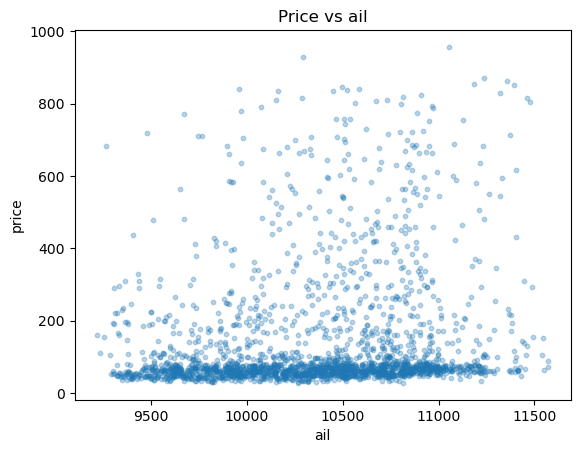

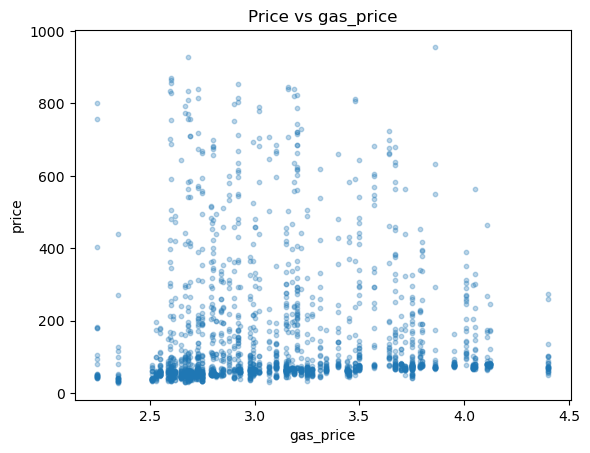

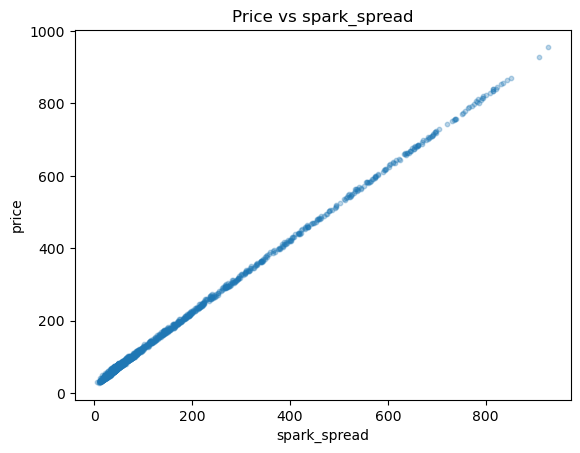

In [33]:
columns = ['ail', 'gas_price', 'spark_spread']
for col in columns:
    plt.scatter(df_2023[col], df_2023['price'], alpha=0.3, s=10)
    plt.xlabel(col)
    plt.ylabel('price')
    plt.title(f'Price vs {col}')
    plt.show()


## SUPPLY

In [34]:
power_supply_df = pd.read_csv('../../data/raw/gen.csv')
unique_values = power_supply_df["Fuel Type"].unique()
# Print the unique values
print(unique_values)
power_supply_df.shape
power_supply_df

['Wind' 'Coal' 'Cogeneration' 'Solar' 'Combined Cycle' 'Hydro' 'Dual Fuel'
 'Other' 'Simple Cycle']


,Date - MST,Fuel Type,Date,Date (MPT),Date (MST),Availability Factor,Availability Utilization,Capacity Factor,Maximum Capacity,System Available,System Capacity,System Generation,Total Generation
0,9/1/2016 12:00:00 AM,Wind,9/1/2016,9/18/2016 10:00:00 PM,9/18/2016 9:00:00 PM,0.975779,0.564800,0.551640,1445,1410,1445.0,796.367713,797.119970
1,9/1/2016 12:00:00 AM,Wind,9/1/2016,9/19/2016 7:00:00 AM,9/19/2016 6:00:00 AM,0.975779,0.310932,0.303289,1445,1410,1445.0,438.414744,438.251953
2,6/1/2017 12:00:00 AM,Wind,6/1/2017,6/7/2017 8:00:00 AM,6/7/2017 7:00:00 AM,0.975779,0.174461,0.170052,1445,1410,1445.0,245.990538,245.725037
3,6/1/2017 12:00:00 AM,Wind,6/1/2017,6/9/2017 7:00:00 AM,6/9/2017 6:00:00 AM,0.975779,0.715791,0.690351,1445,1410,1445.0,1009.264668,997.557683
4,6/1/2017 12:00:00 AM,Wind,6/1/2017,6/21/2017 6:00:00 PM,6/21/2017 5:00:00 PM,0.975779,0.629981,0.614972,1445,1410,1445.0,888.273116,888.634859
...,...,...,...,...,...,...,...,...,...,...,...,...,...
347635,2/1/2015 12:00:00 AM,Wind,2/1/2015,2/28/2015 6:00:00 PM,2/28/2015 6:00:00 PM,0.092050,2.925353,0.270026,1434,132,1418.0,386.146601,387.216955
347636,2/1/2015 12:00:00 AM,Wind,2/1/2015,2/28/2015 7:00:00 PM,2/28/2015 7:00:00 PM,0.092050,2.301562,0.212982,1434,132,1418.0,303.806191,305.415657
347637,2/1/2015 12:00:00 AM,Wind,2/1/2015,2/28/2015 8:00:00 PM,2/28/2015 8:00:00 PM,0.092050,1.545522,0.142179,1434,132,1418.0,204.008941,203.884650
347638,2/1/2015 12:00:00 AM,Wind,2/1/2015,2/28/2015 9:00:00 PM,2/28/2015 9:00:00 PM,0.092050,1.349393,0.123529,1434,132,1418.0,178.119910,177.140417


In [35]:
pivoted_df = pd.pivot_table(power_supply_df, values='Total Generation', index='Date (MST)', columns='Fuel Type', aggfunc='sum')
pivoted_df.columns = ['Total Generation-' + str(col) for col in pivoted_df.columns]
pivoted_df = pivoted_df.reset_index()
pivoted_df = pivoted_df.fillna(0)
# pivoted_df = pivoted_df.set_index('Date (MST)')
pivoted_df.head()

print(pivoted_df.columns)
pivoted_df['Date (MST)'] = pd.to_datetime(pivoted_df['Date (MST)'])
# ail_df['date'] = pd.to_datetime(ail_df['date'])
merged_power_df = pd.merge(ail_df, pivoted_df,  left_index=True, right_on='Date (MST)')
merged_power_df.corr('spearman').style.background_gradient()

Index(['Date (MST)', 'Total Generation-Coal', 'Total Generation-Cogeneration',
       'Total Generation-Combined Cycle', 'Total Generation-Dual Fuel',
       'Total Generation-Hydro', 'Total Generation-Other',
       'Total Generation-Simple Cycle', 'Total Generation-Solar',
       'Total Generation-Wind'],
      dtype='object')


,ail,gas_price,price,spark_spread,temp_lag_0,temp_lag_1,temp_lag_2,temp_lag_3,temp_lag_4,temp_lag_5,temp_lag_6,temp_lag_7,temp_lag_8,temp_lag_9,temp_lag_10,temp_lag_11,temp_lag_12,temp_lag_13,temp_lag_14,temp_lag_15,temp_lag_16,temp_lag_17,temp_lag_18,temp_lag_19,temp_lag_20,temp_lag_21,temp_lag_22,temp_lag_23,temp_lag_24,Total Generation-Coal,Total Generation-Cogeneration,Total Generation-Combined Cycle,Total Generation-Dual Fuel,Total Generation-Hydro,Total Generation-Other,Total Generation-Simple Cycle,Total Generation-Solar,Total Generation-Wind
ail,1.000000,0.062697,0.571240,0.431391,1.000000,0.975697,0.914429,0.831669,0.737273,0.638402,0.542708,0.457893,0.390542,0.343139,0.312702,0.294792,0.288076,0.292509,0.307563,0.334290,0.377225,0.439579,0.519034,0.608944,0.701407,0.788814,0.864319,0.918952,0.939101,0.182332,0.609349,0.487178,0.266758,0.086728,0.282852,0.457610,0.279040,0.000629
gas_price,0.062697,1.000000,-0.109243,-0.516454,0.062697,0.062623,0.062525,0.062383,0.062255,0.062145,0.062045,0.061979,0.061875,0.061724,0.061566,0.061401,0.061242,0.061073,0.060851,0.060561,0.060227,0.059854,0.059509,0.059226,0.058964,0.058705,0.058444,0.058158,0.057845,0.467048,-0.182395,-0.372273,-0.337962,-0.135928,0.017513,-0.402749,-0.329819,-0.024730
price,0.571240,-0.109243,1.000000,0.874105,0.571240,0.556561,0.524435,0.482203,0.434644,0.385325,0.338729,0.298198,0.266744,0.245235,0.232473,0.226378,0.226911,0.233466,0.244045,0.259008,0.280724,0.310022,0.345927,0.386014,0.426720,0.464812,0.497376,0.520384,0.527261,-0.287573,0.618338,0.633442,0.672330,0.163127,0.131838,0.734868,0.457809,-0.312582
spark_spread,0.431391,-0.516454,0.874105,1.000000,0.431391,0.419864,0.394176,0.360276,0.321979,0.282243,0.244863,0.212510,0.187485,0.170513,0.160515,0.155727,0.156321,0.161762,0.170239,0.182009,0.199232,0.222657,0.251447,0.283635,0.316330,0.346937,0.373223,0.392019,0.397944,-0.471209,0.591355,0.710679,0.715029,0.203213,0.096698,0.818438,0.499144,-0.259943
temp_lag_0,1.000000,0.062697,0.571240,0.431391,1.000000,0.975697,0.914429,0.831669,0.737273,0.638402,0.542708,0.457893,0.390542,0.343139,0.312702,0.294792,0.288076,0.292509,0.307563,0.334290,0.377225,0.439579,0.519034,0.608944,0.701407,0.788814,0.864319,0.918952,0.939101,0.182332,0.609349,0.487178,0.266758,0.086728,0.282852,0.457610,0.279040,0.000629
temp_lag_1,0.975697,0.062623,0.556561,0.419864,0.975697,1.000000,0.975698,0.914430,0.831670,0.737273,0.638401,0.542704,0.457886,0.390532,0.343128,0.312690,0.294779,0.288062,0.292495,0.307549,0.334276,0.377213,0.439571,0.519033,0.608946,0.701409,0.788816,0.864321,0.918953,0.169047,0.604759,0.476745,0.265263,0.049584,0.284936,0.450809,0.252319,0.016566
temp_lag_2,0.914429,0.062525,0.524435,0.394176,0.914429,0.975698,1.000000,0.975698,0.914429,0.831667,0.737268,0.638392,0.542691,0.457870,0.390514,0.343107,0.312668,0.294756,0.288039,0.292471,0.307525,0.334254,0.377199,0.439569,0.519036,0.608949,0.701414,0.788820,0.864323,0.137808,0.599169,0.450043,0.260840,-0.007602,0.286697,0.423706,0.213123,0.033618
temp_lag_3,0.831669,0.062383,0.482203,0.360276,0.831669,0.914430,0.975698,1.000000,0.975697,0.914427,0.831661,0.737258,0.638377,0.542673,0.457848,0.390489,0.343080,0.312639,0.294726,0.288008,0.292440,0.307496,0.334236,0.377198,0.439574,0.519041,0.608956,0.701420,0.788823,0.096181,0.594121,0.413436,0.254586,-0.074528,0.288518,0.383323,0.161430,0.050997
temp_lag_4,0.737273,0.062255,0.434644,0.321979,0.737273,0.831670,0.914429,0.975697,1.000000,0.975696,0.914423,0.831653,0.737245,0.638361,0.542652,0.457822,0.390460,0.343049,0.312606,0.294692,0.287973,0.292407,0.307476,0.334235,0.377203,0.439580,0.519049,0.608963,0.701423,0.049046,0.590475,0.371744,0.247313,-0.144643,0.290289,0.335312,0.101602,0.067563
temp_lag_5,0.638402,0.062145,0.385325,0.282243,0.638402,0.737273,0.831667,0.914427,0.975696,1.000000,0.975695,0.914418,0.831645,0.737233,0.638343,0.542629,0.457795,0.390429,0.343014,0.312570,0.294654,0.287937,0.292384,0.307474,0.334241,0.377210,0.439588,0.5190

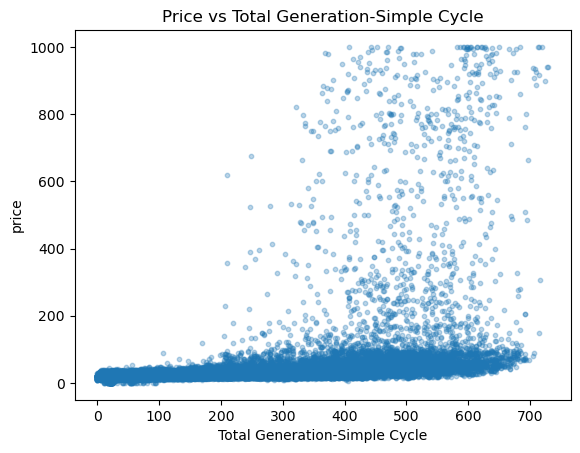

In [36]:
columns = ['Total Generation-Simple Cycle']
for col in columns:
    plt.scatter(merged_power_df[col], merged_power_df['price'], alpha=0.3, s=10)
    plt.xlabel(col)
    plt.ylabel('price')
    plt.title(f'Price vs {col}')
    plt.show()


In [37]:
merged_power_df.head()
# merged_power_df.columns

,hourly_profile,season,ail,gas_price,price,spark_spread,temp_lag_0,temp_lag_1,temp_lag_2,temp_lag_3,...,Date (MST),Total Generation-Coal,Total Generation-Cogeneration,Total Generation-Combined Cycle,Total Generation-Dual Fuel,Total Generation-Hydro,Total Generation-Other,Total Generation-Simple Cycle,Total Generation-Solar,Total Generation-Wind
4,OFF PEAK,WINTER,9210,2.63,37.45,17.725,9210,NaN,NaN,NaN,...,2015-01-01 00:00:00,5017.774104,3160.867734,431.561644,0.0,124.594162,257.471359,54.690663,0.0,863.749816
6,OFF PEAK,WINTER,9045,2.63,34.62,14.895,9045,9210.0,NaN,NaN,...,2015-01-01 01:00:00,4876.329943,3175.624744,412.745831,0.0,103.034401,260.378571,31.471947,0.0,926.577203
8,OFF PEAK,WINTER,8839,2.63,22.80,3.075,8839,9045.0,9210.0,NaN,...,2015-01-01 02:00:00,4687.084844,3011.574913,330.973534,0.0,78.470037,261.705489,19.169070,0.0,824.223942
10,OFF PEAK,WINTER,8742,2.63,21.05,1.325,8742,8839.0,9045.0,9210.0,...,2015-01-01 03:00:00,4549.331730,3003.124608,312.442095,0.0,83.937844,260.724175,19.187236,0.0,764.151265
12,OFF PEAK,WINTER,8699,2.63,20.79,1.065,8699,8742.0,8839.0,9045.0,...,2015-01-01 04:00:00,4458.423948,3007.623005,295.441208,0.0,92.262471,254.193872,19.281390,0.0,823.362452


In [ ]:
columns = ['Total Generation-Simple Cycle']
for col in columns:
    plt.scatter(supply_df_2023[col], supply_df_2023['price'], alpha=0.3, s=10)
    plt.xlabel(col)
    plt.ylabel('price')
    plt.title(f'Price vs {col}')
    plt.show()


In [ ]:
power_supply_df.head()

In [ ]:
# power_supply_df = power_supply_df.set_index('Date (MST)')
power_supply_df.index = pd.to_datetime(power_supply_df.index)
lowest_year = power_supply_df.index.year.min()
highest_year = power_supply_df.index.year.max()
earliest_date = power_supply_df.index.min()
latest_date = power_supply_df.index.max()

print('Earliest date:', earliest_date)
print('Latest date:', latest_date)
print('Lowest year of region df:', lowest_year)
print('Highest year of region df:', highest_year)
print('Shape:', power_supply_df.shape)